<a href="https://colab.research.google.com/github/nissimlab/scRNA-seq-fixed-pancreas/blob/main/clustering_annotation/Methods_Comparison_FixNCut_GSE180212_GSE141017_PRJNA835747_clustering_annotations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#ran 20230425
#Integration, clustering, and annotation for all control methods comparisons for scCODA in SupplementaryTable1

Filtering
>>scDblFinder doublets removed

>>200genes, 1000counts, 20% mito filtering

>>100k max counts filter

## link Gdrive

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


# Installing packages on Colab

In [ ]:
!pip install setuptools-scm install scanpy anndata==0.8.0 leidenalg watermark numpy==1.22.4 pandas==1.5.3 umap-learn==0.5.3 plotnine==0.8.0 panel muon rpy2==3.4.5 anndata2ri triku ray harmonypy celltypist sklearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.1/96.1 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 60.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 60.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 81.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.5/291.5 kB 28.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 19.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing 

In [ ]:
!sudo apt-get install -y libharfbuzz-dev libharfbuzz-dev libfribidi-dev libcairo2-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  gir1.2-harfbuzz-0.0 libblkid-dev libcairo-script-interpreter2 libffi-dev
  libglib2.0-dev libglib2.0-dev-bin libgraphite2-dev libharfbuzz-gobject0
  libharfbuzz-icu0 liblzo2-2 libmount-dev libpixman-1-dev libselinux1-dev
  libsepol1-dev libxcb-render0-dev libxcb-shm0-dev
Suggested packages:
  libcairo2-doc libgirepository1.0-dev libglib2.0-doc libgdk-pixbuf2.0-bin
  | libgdk-pixbuf2.0-dev libxml2-utils libgraphite2-utils
The following NEW packages will be installed:
  gir1.2-harfbuzz-0.0 libblkid-dev libcairo-script-interpreter2 libcairo2-dev
  libffi-dev libfribidi-dev libglib2.0-dev libglib2.0-dev-bin libgraphite2-dev
  libharfbuzz-dev libharfbuzz-gobject0 libharfbuzz-icu0 liblzo2-2 libmount-dev
  libpixman-1-dev libselinux1-dev libsepol1-dev libxcb-render0-dev
  libxcb-shm0-dev
0 upgraded, 19 newly installed, 0 to remove and 24 not up

In [ ]:
!pip install matplotlib==3.5.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 3.5 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
arviz 0.15.1 requires pandas>=1.3.0, but you have pandas 1.1.5 which is incompatible.


## Import packages

If you want modules to be automatically reloaded when you call them, use `autoreload`:

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import scanpy as sc
import numpy as np
import re
import os
import pandas as pd
import seaborn as sb
import matplotlib
import scipy.sparse as sp
from scipy.sparse import issparse
import anndata2ri
import triku as tk
import re

import matplotlib as mpl
from scipy import stats as scistats
import matplotlib.pyplot as pl
import scanpy.external as sce
from matplotlib import colors
from pathlib import Path
from ipywidgets import interactive


import muon as mu
from muon import prot as pt

%matplotlib inline


In [ ]:
%pprint
import time
timestr = time.strftime("%d%m%Y-%H%M%S")
print(timestr)

Pretty printing has been turned OFF
25042023-140053


In [ ]:
# R integration
import anndata2ri
import logging
import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

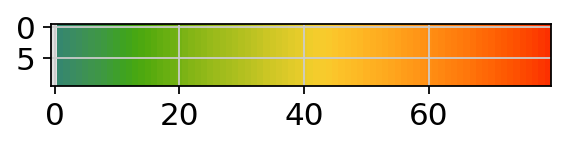

In [ ]:
import colorcet as cc

xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
colorsComb = np.vstack([pl.cm.Greys_r(np.linspace(0.8,0.1, 1)), cc.cm.rainbow_bgyr_35_85_c72(np.linspace(0.2,1, 100))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
pl.imshow(xs, cmap=mymap);  # use tab completion to choose

In [ ]:
%cd /content/

/content


In [ ]:
# add extra code to the path
!wget https://www.dropbox.com/s/xp4jrhczc0x4aa7/proportions.py
import sys
sys.path.append('/content/')
from proportions import show_values,plot_proportion_barplot_with_ncells

--2023-04-25 14:00:55--  https://www.dropbox.com/s/xp4jrhczc0x4aa7/proportions.py
Resolving www.dropbox.com (www.dropbox.com)... 162.125.80.18, 2620:100:6031:18::a27d:5112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.80.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/xp4jrhczc0x4aa7/proportions.py [following]
--2023-04-25 14:00:55--  https://www.dropbox.com/s/raw/xp4jrhczc0x4aa7/proportions.py
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uce74b6731965c2b10a384635126.dl.dropboxusercontent.com/cd/0/inline/B63O5SDx9dW5gwtwkoYWERJLVJgf5vPN-aV-EhPvf9ZDW167-VH9xTm30zQ-GaSCH6o_lK5uy8iUFLI6USYRvhYWMsTxuU_aCUarEMQmJVTrd0OsNWPC4XZJ5FznGSW69VVvaRFfijTKkfR1HIVFkRzenHqQcayUgJv26DXGUqc9UQ/file# [following]
--2023-04-25 14:00:56--  https://uce74b6731965c2b10a384635126.dl.dropboxusercontent.com/cd/0/inline/B63O5SDx9dW5gwtwkoYWERJLVJgf5vPN-aV-EhPvf9ZDW167-VH9xTm30zQ-GaSCH6o_lK5

#Reproducibility

#Print package versions

In [ ]:
%load_ext watermark
%watermark
%watermark --iversions -v -m -p numpy,scipy,sklearn,anndata,scanpy,muon,anndata2ri,rpy2,triku

Last updated: 2023-04-25T14:00:58.720755+00:00

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 7.34.0

Compiler    : GCC 9.4.0
OS          : Linux
Release     : 5.10.147+
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 7.34.0

numpy     : 1.22.4
scipy     : 1.10.1
sklearn   : 0.0.post4
anndata   : 0.8.0
scanpy    : 1.9.3
muon      : 0.1.3
anndata2ri: 1.1
rpy2      : 3.4.5
triku     : 2.1.6

Compiler    : GCC 9.4.0
OS          : Linux
Release     : 5.10.147+
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

numpy     : 1.22.4
pandas    : 1.1.5
scanpy    : 1.9.3
seaborn   : 0.12.2
scipy     : 1.10.1
bbknn     : 1.5.1
logging   : 0.5.1.2
rpy2      : 3.4.5
colorcet  : 3.0.1
anndata2ri: 1.1
sys       : 3.9.16 (main, Dec  7 2022, 01:11:51) 
[GCC 9.4.0]
triku     : 2.1.6
re        : 2.2.1
muon      : 0.1.3
matplotl

## Set global parameters

Set some plotting parameters.

In [ ]:
sc._settings.ScanpyConfig.n_jobs=8

pl.rcParams['pdf.fonttype'] = 'truetype'
sc.set_figure_params(vector_friendly=False,dpi_save=300,transparent=True)
pl.rcParams['lines.linewidth'] = 0.1

Set other global parameters

In [ ]:
random_state=42
# should figures just be displayed or also saved?
save_figure = False

# should cashed values be used, or recompute?
force_recompute = False

In [ ]:
#@title load accesory funtions
#@markdown
"""Functions for downstream work with outputs of remove-background."""

import tables
import numpy as np
import scipy.sparse as sp
from typing import Dict


def dict_from_h5(file: str) -> Dict[str, np.ndarray]:
    """Read in everything from an h5 file and put into a dictionary."""
    d = {}
    with tables.open_file(file) as f:
        # read in everything
        for array in f.walk_nodes("/", "Array"):
            d[array.name] = array.read()
    return d


def anndata_from_h5(file: str,
                    analyzed_barcodes_only: bool = True) -> 'anndata.AnnData':
    """Load an output h5 file into an AnnData object for downstream work.

    Args:
        file: The h5 file
        analyzed_barcodes_only: False to load all barcodes, so that the size of
            the AnnData object will match the size of the input raw count matrix.
            True to load a limited set of barcodes: only those analyzed by the
            algorithm. This allows relevant latent variables to be loaded
            properly into adata.obs and adata.obsm, rather than adata.uns.

    Returns:
        adata: The anndata object, populated with inferred latent variables
            and metadata.

    """

    try:
        import anndata
    except ImportError:
        raise ImportError('The anndata package must be installed to use the '
                          'function anndata_from_h5()')

    d = dict_from_h5(file)
    X = sp.csc_matrix((d.pop('data'), d.pop('indices'), d.pop('indptr')),
                      shape=d.pop('shape')).transpose().tocsr()

    if analyzed_barcodes_only:
        if 'barcodes_analyzed_inds' in d.keys():
            X = X[d['barcodes_analyzed_inds'], :]
            d['barcodes'] = d['barcodes'][d['barcodes_analyzed_inds']]
        elif 'barcode_indices_for_latents' in d.keys():
            X = X[d['barcode_indices_for_latents'], :]
            d['barcodes'] = d['barcodes'][d['barcode_indices_for_latents']]
        else:
            print('Warning: analyzed_barcodes_only=True, but the key '
                  '"barcodes_analyzed_inds" or "barcode_indices_for_latents" '
                  'is missing from the h5 file. '
                  'Will output all barcodes, and proceed as if '
                  'analyzed_barcodes_only=False')

    # Construct the count matrix.
    adata = anndata.AnnData(X=X,
                            obs={'barcode': d.pop('barcodes').astype(str)},
                            var={'gene_name': (d.pop('gene_names') if 'gene_names' in d.keys()
                                               else d.pop('name')).astype(str)})
    adata.obs.set_index('barcode', inplace=True)
    adata.var.set_index('gene_name', inplace=True)

    # Add other information to the adata object in the appropriate slot.
    for key, value in d.items():
        try:
            value = np.asarray(value)
            if len(value.shape) == 0:
                adata.uns[key] = value
            elif value.shape[0] == X.shape[0]:
                if (len(value.shape) < 2) or (value.shape[1] < 2):
                    adata.obs[key] = value
                else:
                    adata.obsm[key] = value
            elif value.shape[0] == X.shape[1]:
                if value.dtype.name.startswith('bytes'):
                    adata.var[key] = value.astype(str)
                else:
                    adata.var[key] = value
            else:
                adata.uns[key] = value
        except Exception:
            print('Unable to load data into AnnData: ', key, value, type(value))

    if analyzed_barcodes_only:
        for col in adata.obs.columns[adata.obs.columns.str.startswith('barcodes_analyzed')
                                     | adata.obs.columns.str.startswith('barcode_indices')]:
            try:
                del adata.obs[col]
            except Exception:
                pass

    return adata


def load_anndata_from_input_and_output(input_file: str,
                                       output_file: str,
                                       analyzed_barcodes_only: bool = True,
                                       input_layer_key: str = 'cellranger') -> 'anndata.AnnData':
    """Load remove-background output count matrix into an anndata object,
    together with remove-background metadata and the raw input counts.

    Args:
        input_file: Raw h5 file used as input for remove-background.
        output_file: Output h5 file created by remove-background (can be
            filtered or not).
        analyzed_barcodes_only: Argument passed to anndata_from_h5().
            False to load all barcodes, so that the size of
            the AnnData object will match the size of the input raw count matrix.
            True to load a limited set of barcodes: only those analyzed by the
            algorithm. This allows relevant latent variables to be loaded
            properly into adata.obs and adata.obsm, rather than adata.uns.
        input_layer_key: Key of the anndata.layer that is created for the raw
            input count matrix.

    Return:
        adata_out: AnnData object with counts before and after remove-background,
            as well as inferred latent variables from remove-background.

    """

    # Load input data.
    adata_raw = anndata_from_h5(input_file, analyzed_barcodes_only=False)

    # Load remove-background output data.
    adata_out = anndata_from_h5(output_file, analyzed_barcodes_only=analyzed_barcodes_only)

    # Subset the raw dataset to the relevant barcodes.
    adata_raw = adata_raw[adata_out.obs.index]

    # Put count matrices into 'layers' in anndata for clarity.
    adata_out.layers[input_layer_key] = adata_raw.X.copy()
    adata_out.layers['cellbender'] = adata_out.X.copy()

    # Pre-compute a bit of metadata.
    adata_out.var['n_cellranger'] = np.array(adata_out.layers['cellranger'].sum(axis=0)).squeeze()
    adata_out.var['n_cellbender'] = np.array(adata_out.layers['cellbender'].sum(axis=0)).squeeze()

    return adata_out

# Setup WD

In [ ]:
folder='/content/drive/MyDrive/CIP_v3_data/Methods_Comparison/'

samplename='Methods_Comparison_Zhou_v3'
random_state=42


import os
os.chdir(folder)
if not os.path.exists('./figures/'):
    os.makedirs('./figures/')

# import data as H5AD

In [ ]:
#adata=sc.read(samplename+'_QCfilteredNormalized_Harmony_Triku_Neighbors_annotated_20230112.h5ad')

In [ ]:
#adata.write(samplename+'_DblfilteredNormalized_Harmony_Triku_Neighbors_annotated_20221116.h5ad')

# Load Samples

In [ ]:
#controls
adata1=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/W5_1_compare70k_clean.h5ad')
adata2=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/W5_2_compare70k_clean.h5ad')

adata3=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/W7_14_expect4_include75k_clean.h5ad')

adata4=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/W7_17_e4k_i70k_cellbender_clean.h5ad')
adata5=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/W7_18_e4k_i70k_cellbender_clean.h5ad')

adata6=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_E3_CR7_RawGeneFilter50_clean.h5ad')
adata7=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_F3_CR7_RawGeneFilter50_clean.h5ad')
adata8=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_G3_CR7_RawGeneFilter50_clean.h5ad')
adata9=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_H3_CR7_RawGeneFilter50_clean.h5ad')

adata10=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Poggetto_control_CR7_RawGeneFilter50_clean.h5ad')
adata11=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/WT_1_RawGeneFilter50_clean.h5ad')
adata12=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/WT_2_RawGeneFilter50_clean.h5ad')

# rename several samples variables

In [ ]:
list_of_adata = [adata1, adata2, adata3, adata4, adata5]
for adata in list_of_adata:
    adata.obs['sample'] = ['FixNCut']*adata.n_obs
    adata.obs['condition'] = ['Control']*adata.n_obs

In [ ]:
adata10.obs['sample'] = ['Protocol1']*adata10.n_obs

In [ ]:
list_of_adata = [adata6,adata7,adata8,adata9]
for adata in list_of_adata:
    adata.obs['sample'] = ['Protocol2']*adata.n_obs

In [ ]:
list_of_adata = [adata11,adata12]
for adata in list_of_adata:
    adata.obs['sample'] = ['Protocol3']*adata.n_obs

In [ ]:
adata1.obs['donor'] = ['control_1']*adata1.n_obs
adata2.obs['donor'] = ['control_2']*adata2.n_obs
adata3.obs['donor'] = ['control_3']*adata3.n_obs
adata4.obs['donor'] = ['control_4']*adata4.n_obs
adata5.obs['donor'] = ['control_5']*adata5.n_obs

In [ ]:
adata11.obs['condition'] = ['Control']*adata11.n_obs
adata12.obs['condition'] = ['Control']*adata12.n_obs

In [ ]:
adata6.obs['donor'] = ['S_1']*adata6.n_obs
adata7.obs['donor'] = ['S_2']*adata7.n_obs
adata8.obs['donor'] = ['S_3']*adata8.n_obs
adata9.obs['donor'] = ['S_4']*adata9.n_obs
adata10.obs['donor'] = ['P_1']*adata10.n_obs
adata11.obs['donor'] = ['Z_1']*adata11.n_obs
adata12.obs['donor'] = ['Z_2']*adata12.n_obs

In [ ]:
#adjust for # of samples
adata = adata1.concatenate(adata2,adata3,adata4,adata5,adata6,adata7,adata8,adata9,adata10,adata11,adata12)
adata

AnnData object with n_obs × n_vars = 61642 × 32285
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch'
    var: 'feature_type', 'id', 'mito', 'ambient_expression-0', 'n_cellranger-0', 'n_cellbender-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'ambient_expression-1', 'n_cellranger-1', 'n_cellbender-1', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'ambient_expression-10', 'n_cellranger-10', 'n_cellbender-10', 'n_cells_by_counts-10',

In [ ]:
adata.layers["counts"]=adata.X

Let's remove all genes expressed in fewer than 5 cells:

In [ ]:
sc.pp.filter_genes(adata, min_cells=5)
print('Number of genes after gene filter: {:d}'.format(adata.n_vars))

Number of genes after gene filter: 23983


In [ ]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

# compute qc metrics

regex = re.compile('^(MT-).*', re.IGNORECASE)
mito_genes = [l for l in adata.var_names for m in [regex.search(l)] if m]
print('Found {} mito genes and annotated.'.format(len(mito_genes)))
adata.var['mt'] = False
adata.var.loc[mito_genes, 'mt'] = True


adata.var['rb'] = adata.var_names.str.startswith(('Rps','Rpl'))  # annotate the group of ribosomal proteins as 'rb'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

adata

Found 13 mito genes and annotated.


AnnData object with n_obs × n_vars = 61642 × 23983
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb'
    var: 'feature_type', 'id', 'mito', 'ambient_expression-0', 'n_cellranger-0', 'n_cellbender-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'ambient_expression-1', 'n_cellranger-1', 'n_cellbender-1', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'ambient_expre

##deleting variables

In [ ]:
deletevar =['ambient_expression-0', 'n_cellranger-0', 'n_cellbender-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'ambient_expression-1', 'n_cellranger-1', 'n_cellbender-1', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'ambient_expression-10', 'n_cellranger-10', 'n_cellbender-10', 'n_cells_by_counts-10', 'mean_counts-10', 'log1p_mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'log1p_total_counts-10', 'ambient_expression-11', 'n_cellranger-11', 'n_cellbender-11', 'n_cells_by_counts-11', 'mean_counts-11', 'log1p_mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts-11', 'log1p_total_counts-11', 'ambient_expression-2', 'n_cellranger-2', 'n_cellbender-2', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2', 'ambient_expression-3', 'n_cellranger-3', 'n_cellbender-3', 'n_cells_by_counts-3', 'mean_counts-3', 'log1p_mean_counts-3', 'pct_dropout_by_counts-3', 'total_counts-3', 'log1p_total_counts-3', 'ambient_expression-4', 'n_cellranger-4', 'n_cellbender-4', 'n_cells_by_counts-4', 'mean_counts-4', 'log1p_mean_counts-4', 'pct_dropout_by_counts-4', 'total_counts-4', 'log1p_total_counts-4', 'ambient_expression-5', 'n_cellranger-5', 'n_cellbender-5', 'n_cells_by_counts-5', 'mean_counts-5', 'log1p_mean_counts-5', 'pct_dropout_by_counts-5', 'total_counts-5', 'log1p_total_counts-5', 'ambient_expression-6', 'n_cellranger-6', 'n_cellbender-6', 'n_cells_by_counts-6', 'mean_counts-6', 'log1p_mean_counts-6', 'pct_dropout_by_counts-6', 'total_counts-6', 'log1p_total_counts-6', 'ambient_expression-7', 'n_cellranger-7', 'n_cellbender-7', 'n_cells_by_counts-7', 'mean_counts-7', 'log1p_mean_counts-7', 'pct_dropout_by_counts-7', 'total_counts-7', 'log1p_total_counts-7', 'ambient_expression-8', 'n_cellranger-8', 'n_cellbender-8', 'n_cells_by_counts-8', 'mean_counts-8', 'log1p_mean_counts-8', 'pct_dropout_by_counts-8', 'total_counts-8', 'log1p_total_counts-8', 'ambient_expression-9', 'n_cellranger-9', 'n_cellbender-9', 'n_cells_by_counts-9', 'mean_counts-9', 'log1p_mean_counts-9', 'pct_dropout_by_counts-9', 'total_counts-9', 'log1p_total_counts-9']

for x in deletevar:
  del adata.var[x]

In [ ]:
adata

AnnData object with n_obs × n_vars = 61642 × 23983
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'cellbender', 'cellranger', 'counts'

# reorder categories for plotting

In [ ]:
adata.obs['donor'].cat.categories

Index(['P_1', 'S_1', 'S_2', 'S_3', 'S_4', 'Z_1', 'Z_2', 'control_1',
       'control_2', 'control_3', 'control_4', 'control_5'],
      dtype='object')

In [ ]:
adata.obs['donor']= adata.obs['donor'].cat.reorder_categories(['control_1',
       'control_2', 'control_3', 'control_4', 'control_5','P_1', 'S_1', 'S_2', 'S_3', 'S_4', 'Z_1', 'Z_2'])

In [ ]:
adata.obs['sample'].cat.categories

Index(['FixNCut', 'Protocol1', 'Protocol2', 'Protocol3'], dtype='object')

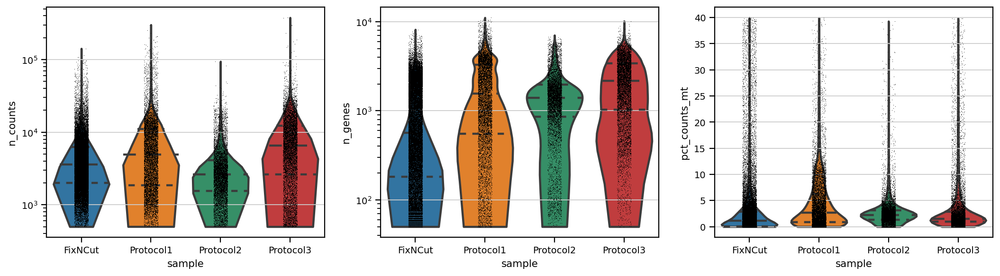

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='sample', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='sample', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'pct_counts_mt', groupby='sample',jitter=0.1, linewidth=2, alpha=0.25, inner="quartile",size=0.5, ax=ax3, show=False,)


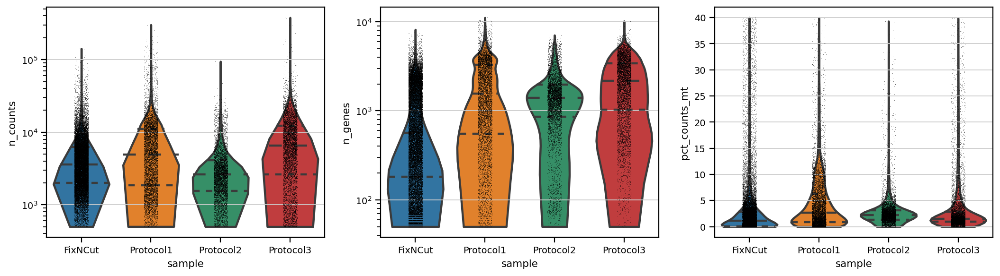

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='sample', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.3, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='sample', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.3, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'pct_counts_mt', groupby='sample',jitter=0.1, linewidth=2, alpha=0.25, inner="quartile",size=0.3, ax=ax3, show=False,)


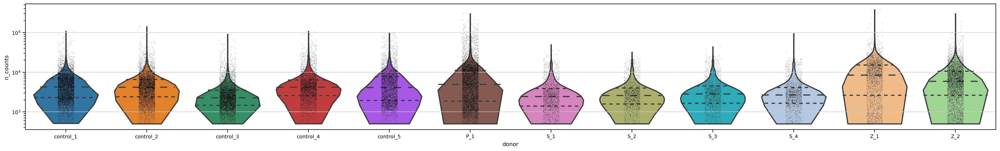

In [ ]:
#nCounts
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(30,4), gridspec_kw={'wspace':0.5
                                                            })

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='donor', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.5, log=True, cut=0, ax=ax1, show=False)


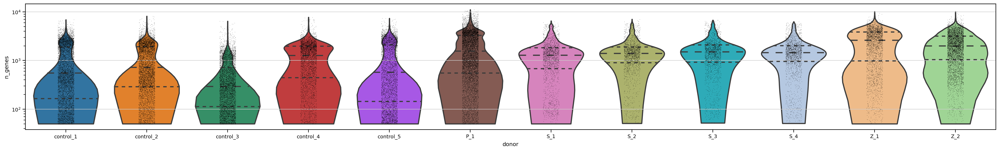

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(30,4), gridspec_kw={'wspace':0.2})

ax1_dict =  sc.pl.violin(adata, 'n_genes', groupby='donor',jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.5, log=True, cut=0, ax=ax1, show=False)


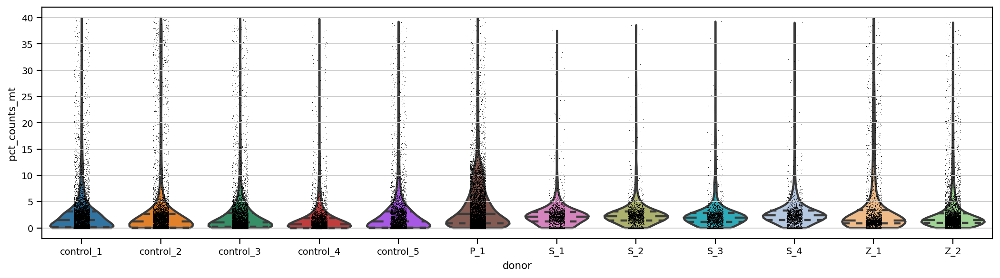

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'pct_counts_mt',jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", groupby='donor',size=0.5, ax=ax1, show=False,)


Let's show those genes that yield the highest fraction of counts in each single cell, across all cells.

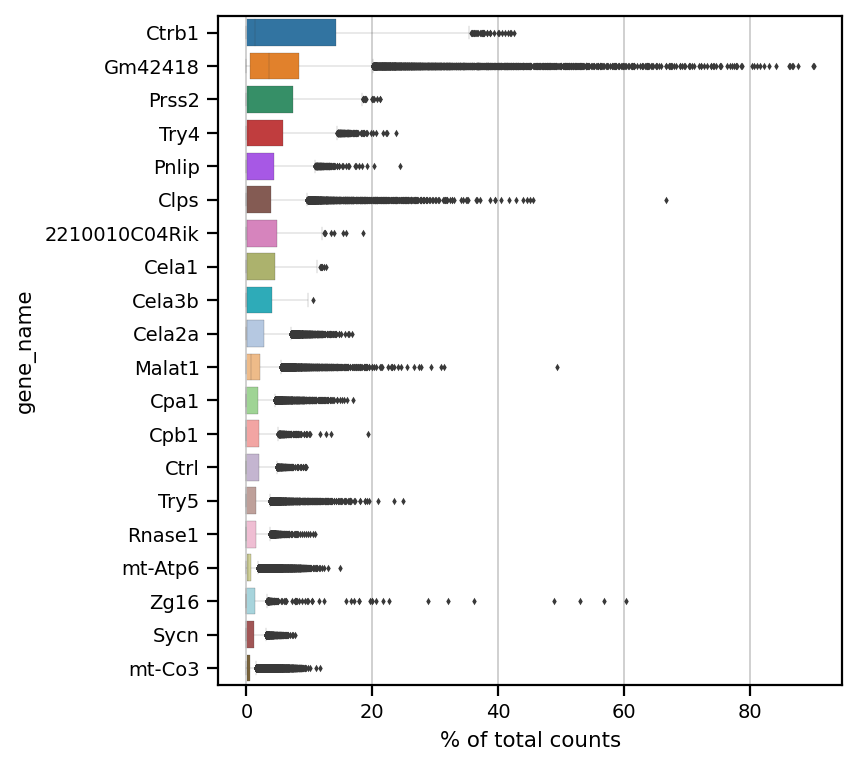

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
sc.pl.highest_expr_genes(adata, n_top=20)

In [ ]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[adata.obs.scDblFinder_class == "singlet"].copy()

print(f"Number of cells after filtering of doublets: {adata.n_obs}")

Total number of cells: 61642
Number of cells after filtering of doublets: 56541


#Initial QC Filtering

# Quality control and pre-processing

## Plot QC for cells that pass tentative thresholds

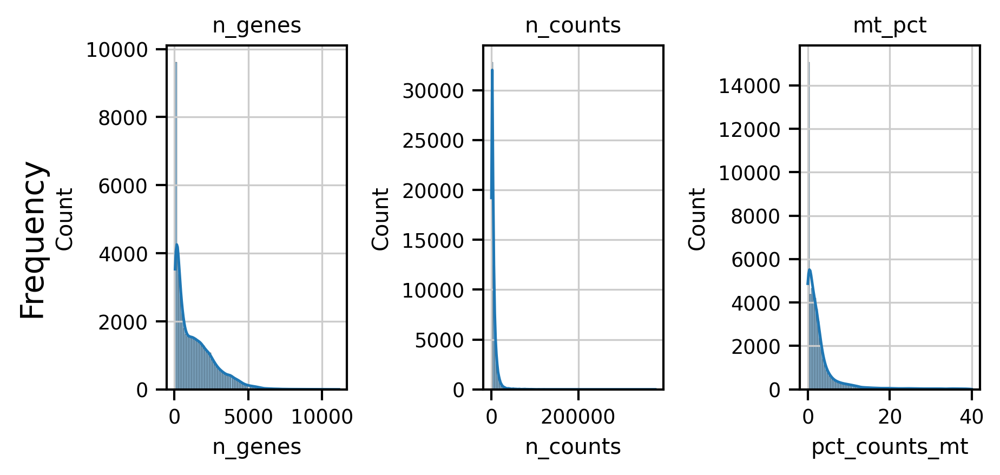

In [ ]:

sb.set_context('paper')


fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(6, 3), dpi=150, sharey=False)
adata.obs['n_genes']

sb.histplot( adata.obs['n_genes'], ax=ax1, kde=True, bins=100)
sb.histplot( adata.obs['n_counts'], ax=ax2, kde=True, bins=100)
sb.histplot(adata.obs['pct_counts_mt'], ax=ax3, kde=True, bins=100)

ax1.title.set_text('n_genes')
ax2.title.set_text('n_counts')
ax3.title.set_text('mt_pct')

fig.text(0.00, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

fig.tight_layout()

#interactive filtering


interactive(children=(IntSlider(value=1000, description='counts', max=2000, step=20), IntSlider(value=200, des…

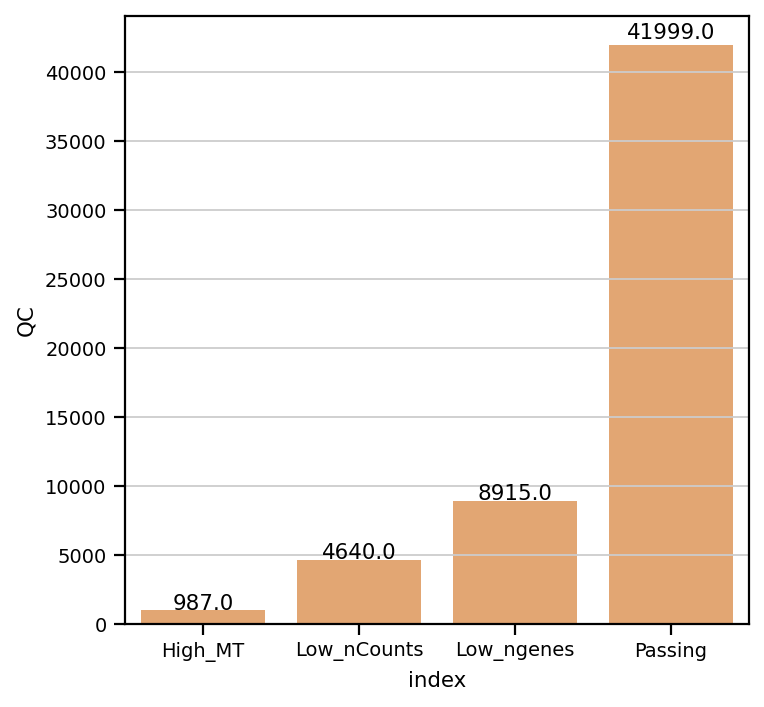

In [ ]:
def h(counts=1000, genes=200,mito=20):
    conditions = [
        (adata.obs['n_counts'] < counts),#Low_nCounts
        (adata.obs['n_genes'] < genes),#Low_ngenes
        (adata.obs['pct_counts_mt'] >mito),#High_MT
        (adata.obs['pct_counts_mt'] <= mito) & (adata.obs['n_counts'] >= counts) & (adata.obs['n_genes'] >= genes)]#Passing
    values = ['Low_nCounts', 'Low_ngenes','High_MT', 'Passing']
    adata.obs['QC'] = np.select(conditions, values)
    adata.obs['QC'] = adata.obs['QC'].astype('category')

    new_df1=pd.DataFrame(adata.obs['QC'].value_counts()).reset_index()
    p=sb.barplot(x='index',y='QC',data=new_df1,color='sandybrown')
    show_values(p)


interactive_plot = interactive(h, counts=(0, 2000,20), genes=(0, 2000,20), mito=(0, 100, 1))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

In [ ]:
adata = adata[adata.obs['QC'] == 'Passing']
adata

View of AnnData object with n_obs × n_vars = 41999 × 23983
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors', 'donor_colors'
    layers: 'cellbender', 'cellranger', 'counts'

In [ ]:
sc.pp.filter_cells(adata, max_counts = 100000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

Number of cells after max count filter: 41924


In [ ]:
adata

AnnData object with n_obs × n_vars = 41924 × 23983
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors', 'donor_colors'
    layers: 'cellbender', 'cellranger', 'counts'

In [ ]:
adata.write(samplename+'_QCfiltered_20230421.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfiltered_20230421.h5ad')
adata



##Normalize QC Passing

### log1p proportional fitting


In [ ]:
adata.layers["counts"] = adata.layers["cellbender"]
adata.X= adata.layers["counts"]
adata.layers["log_norm"]=sc.pp.log1p(sc.pp.normalize_total(adata,inplace=False,target_sum=1e4)["X"])
# proportional fitting to mean of cell depth
proportional_fitting = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
# log1p transform
adata.layers["log1pPF_normalization"] = sc.pp.log1p(proportional_fitting["X"])

In [ ]:
adata.layers["PFlog1pPF_normalization"] = sc.pp.normalize_total(adata, target_sum=None, layer="log1pPF_normalization", inplace=False)["X"]


In [ ]:
adata.write(samplename+'_QCfiltered_Normalized_20230424.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfiltered_Normalized_20230424.h5ad')

# cellcycle score

In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']

In [ ]:
s_genes = ['Mcm5','Pcna','Tyms','Fen1','Mcm7','Mcm4','Rrm1','Ung','Gins2','Mcm6','Cdca7','Dtl','Prim1',
           'Uhrf1','Cenpu','Hells','Rfc2','Polr1b','Nasp','Rad51ap1','Gmnn','Wdr76','Slbp','Ccne2','Ubr7',
           'Pold3','Msh2','Atad2','Rad51','Rrm2','Cdc45','Cdc6','Exo1','Tipin','Dscc1','Blm','Casp8ap2',
           'Usp1','Clspn','Pola1','Chaf1b','Mrpl36','E2f8']
g2m_genes = ['Hmgb2','Cdk1','Nusap1','Ube2c','Birc5','Tpx2','Top2a','Ndc80','Cks2','Nuf2','Cks1b',
             'Mki67','Tmpo','Cenpf','Tacc3','Pimreg','Smc4','Ccnb2','Ckap2l','Ckap2','Aurkb','Bub1',
             'Kif11','Anp32e','Tubb4b','Gtse1','Kif20b','Hjurp','Cdca3','Jpt1','Cdc20','Ttk','Cdc25c',
             'Kif2c','Rangap1','Ncapd2','Dlgap5','Cdca2','Cdca8','Ect2','Kif23','Hmmr','Aurka','Psrc1',
             'Anln','Lbr','Ckap5','Cenpe','Ctcf','Nek2','G2e3','Gas2l3','Cbx5','Cenpa']
cell_cycle_genes = s_genes + g2m_genes
display(len(s_genes))
display(len(g2m_genes))
display(len(cell_cycle_genes))

43

54

97

In [ ]:
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
len(cell_cycle_genes)

97

In [ ]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

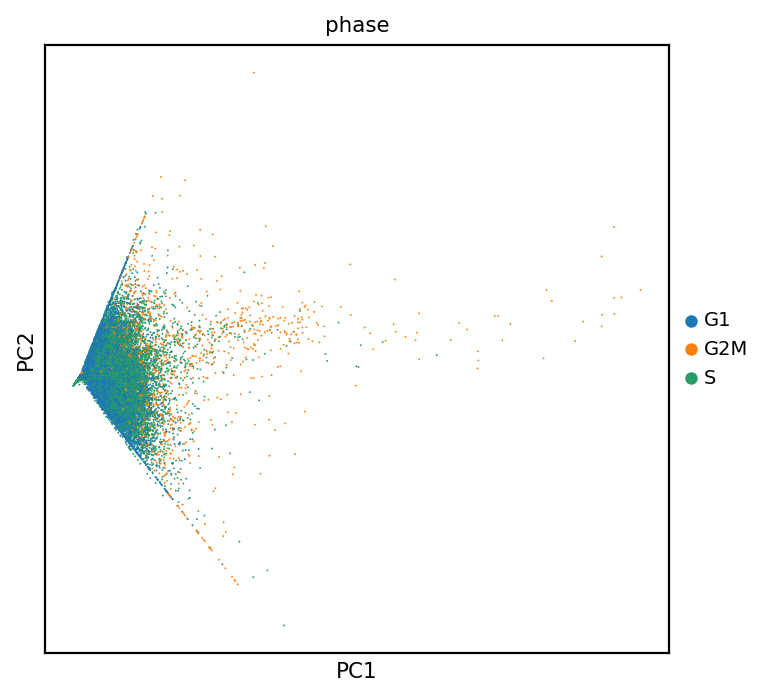

In [ ]:
savefig=samplename+"_8_QC_cellcycle.pdf"

adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase',save=savefig)

##QC passing, Normalized: PFlog1pPF layer, Harmony --> Triku --> neighbors with triku
##RAN 20230112 by EC


In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']
#PCA
sc.pp.pca(adata, n_comps=30,random_state=42,use_highly_variable=False, svd_solver="arpack")
#Harmony
sce.pp.harmony_integrate(adata, key='sample', epsilon_cluster = 1e-4, epsilon_harmony = 1e-5, max_iter_harmony=50)
#neighbors
sc.pp.neighbors(adata, use_rep='X_pca_harmony',  n_neighbors=int(0.5*len(adata) ** 0.5 // 2), metric='cosine')

2023-04-24 19:03:14,642 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2023-04-24 19:03:25,195 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2023-04-24 19:03:25,569 - harmonypy - INFO - Iteration 1 of 50
INFO:harmonypy:Iteration 1 of 50
2023-04-24 19:03:47,650 - harmonypy - INFO - Iteration 2 of 50
INFO:harmonypy:Iteration 2 of 50
2023-04-24 19:04:10,244 - harmonypy - INFO - Iteration 3 of 50
INFO:harmonypy:Iteration 3 of 50
2023-04-24 19:04:27,493 - harmonypy - INFO - Converged after 3 iterations
INFO:harmonypy:Converged after 3 iterations


In [ ]:
adata.write(samplename+'_QCfilteredNormalized_Harmony_20230424.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfilteredNormalized_Harmony_20230424.h5ad')

###run Triku
https://triku.readthedocs.io/en/latest/


In [ ]:
sc.pp.filter_genes(adata, min_cells=20)

In [ ]:
tk.tl.triku(adata, n_windows=100,)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

WARNING | 2023-04-24 19:05:38,467 - triku.logg - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.




 Number of highly variable genes: 1819


In [ ]:
adata

AnnData object with n_obs × n_vars = 41924 × 20732
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'sample_colors', 'donor_colors', 'pca', 'neighbors', 'triku_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_triku'
    varm: 'PCs'
    layers: 'cellbender', 'ce

In [ ]:
adata.X=adata.layers['counts']

In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']
#neighbors
sc.pp.neighbors(adata, n_neighbors=int(0.5*len(adata) ** 0.5 // 2), metric='cosine', use_rep="X_triku")

In [ ]:
adata

AnnData object with n_obs × n_vars = 41924 × 20732
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'sample_colors', 'donor_colors', 'pca', 'neighbors', 'triku_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_triku'
    varm: 'PCs'
    layers: 'cellbender', 'ce

In [ ]:
deletevar =['triku_params']

for x in deletevar:
  del adata.uns[x]

adata

AnnData object with n_obs × n_vars = 41924 × 20732
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'sample_colors', 'donor_colors', 'pca', 'neighbors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_triku'
    varm: 'PCs'
    layers: 'cellbender', 'cellranger', 'coun

In [ ]:
adata.write(samplename+'_QCfilteredNormalized_Harmony_Triku_20230424.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfilteredNormalized_Harmony_Triku_20230424.h5ad')

### Plotting

In [ ]:
sc.tl.umap(adata,random_state=42)

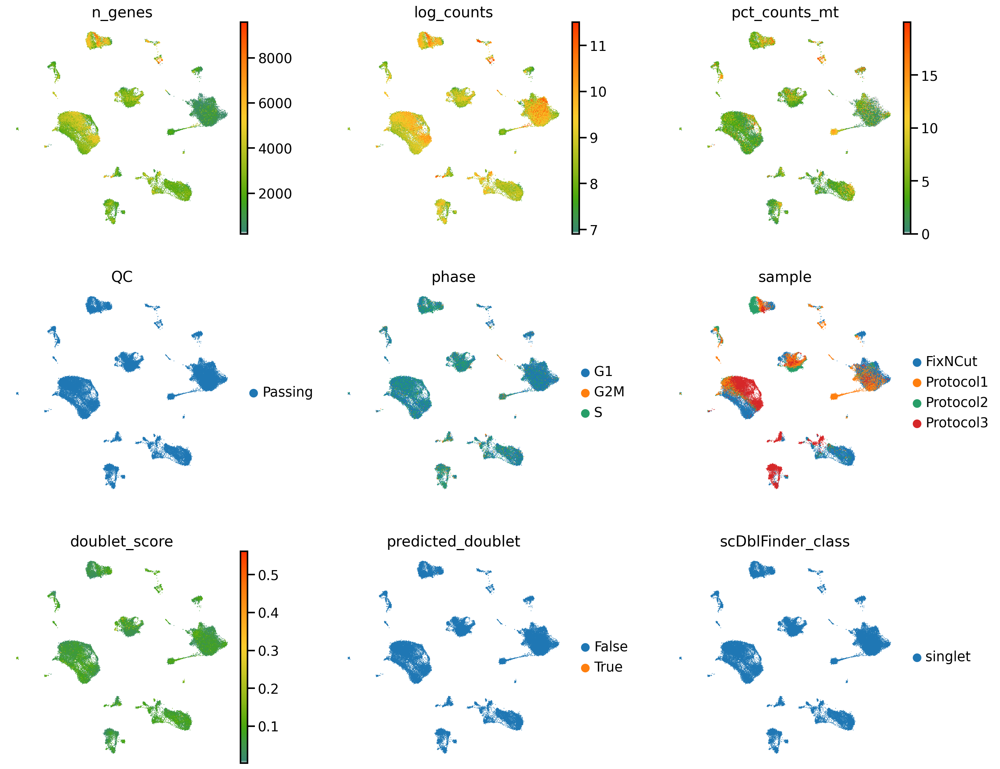

In [ ]:
adata.obs['predicted_doublet'] = adata.obs['predicted_doublet'].astype(str).astype('category')


sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
genes_to_plot = ['n_genes','log_counts','pct_counts_mt','QC','phase','sample','doublet_score','predicted_doublet','scDblFinder_class']"
sc.pl.umap(adata, wspace=0.3,color = genes_to_plot,ncols=3,cmap=mymap,legend_fontoutline=3, legend_fontweight='normal',frameon=False)

In [ ]:
marker_genes=['Clps',	'Spp1',	'Dcn',	'C1qa',	'Cpa1','Cd74',	'Fabp4',	'Cd52'	,'Cd79a',	'Upk3b',	'Mmrn1',	'Prnp'	,'Nupr1',]

In [ ]:
print(len(marker_genes))
filter=np.in1d(marker_genes, adata.var_names)
marker_genes = list(np.array(marker_genes)[filter])
print(len(marker_genes))

13
13


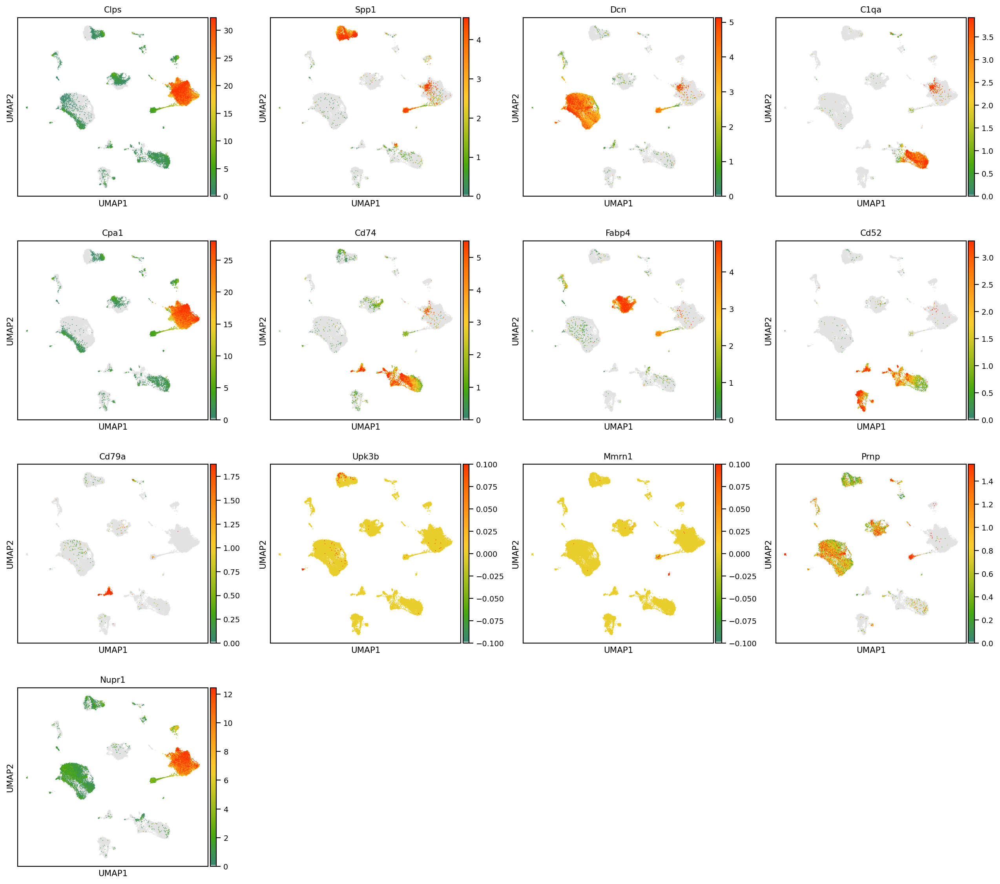

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata=adata, color=marker_genes,color_map=mymap,vmin='p20', vmax='p99',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")#, save=savefig)

##Leiden - keep doublets -> QC Passing, normalized, Harmony, Triku, Neighbors with Triku

In [ ]:
%%capture

sc.tl.leiden(adata,random_state=random_state, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata,random_state=random_state, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata,random_state=random_state, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata,random_state=random_state, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata,random_state=random_state, resolution=0.2, key_added='leiden_r0.2')

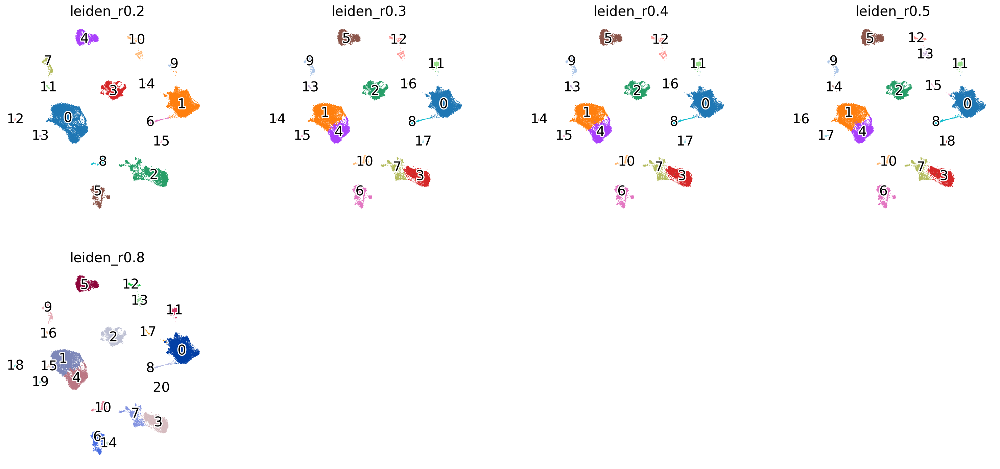

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['leiden_r0.2','leiden_r0.3','leiden_r0.4','leiden_r0.5','leiden_r0.8'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False)

###Chose Leiden

In [ ]:
leiden='leiden_r0.4'

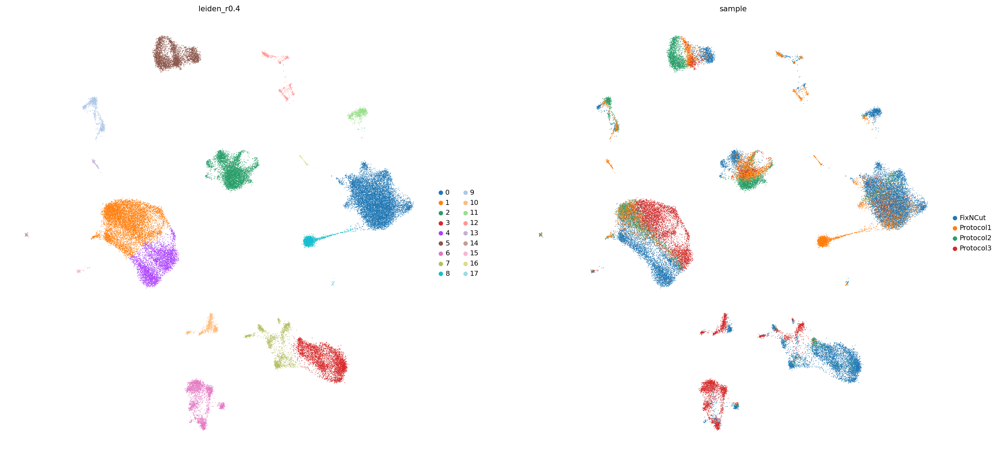

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color=[leiden,'sample'],legend_fontoutline=3, legend_fontweight='normal',frameon=False)

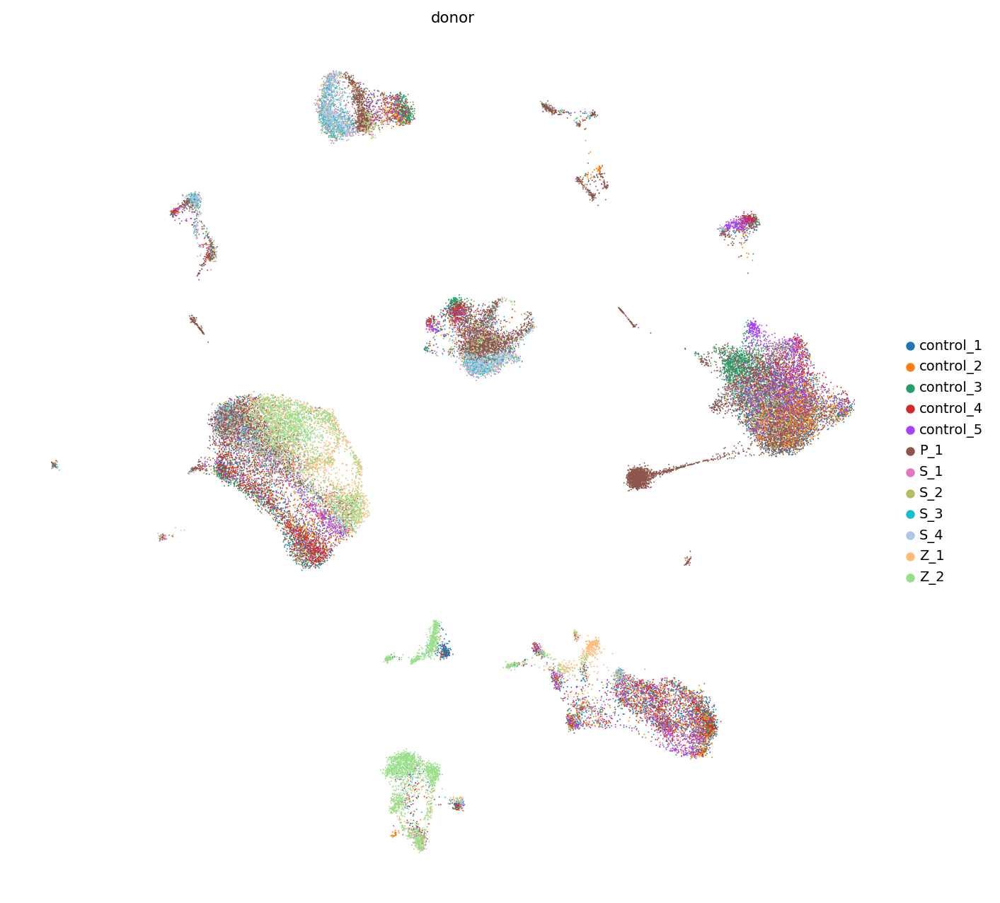

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color=['donor'],legend_fontoutline=3, legend_fontweight='normal',frameon=False)

## plot Markergenes

In [ ]:
markers={'Ductal': ['Clu','Krt19','Sox9','Krt8','Krt18','Spp1','Pkhd1'],
         'Acinar':['Cpa1','Cela1','Cela3b','Zg16','Clps'],
         'ADM':['Cpa1','Clu','Krt19','Sox9','Krt8','Krt18','Spp1','Pkhd1','Cela1','Cela3b','Zg16','Clps']}

In [ ]:
marker_labels = list(set(markers))

In [ ]:
for ix, clust in enumerate(marker_labels):
  geneset=markers[clust]
  sc.tl.score_genes(adata, geneset, ctrl_size=500, use_raw=False,score_name=clust)

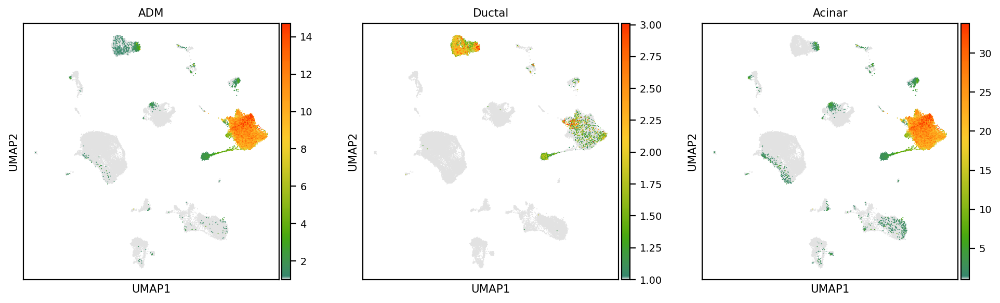

In [ ]:
pl.rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color=marker_labels,sort_order=True,vmin=1, vmax='p99.9',color_map=mymap)

In [ ]:
adata.write(samplename+'_Normalized_Harmony_Triku_Neighbors_20230424.h5ad')

### Rank Marker genes

In [ ]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, leiden, method='wilcoxon',n_genes=adata.shape[1],layer='PFlog1pPF_normalization', rankby_abs=False,corr_method='bonferroni',key_added='wilcoxon_rank_genes_groups' )
wilcoxon=pd.DataFrame(adata.uns['wilcoxon_rank_genes_groups']['names']).head(100)
wilcoxon

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,Cpa1,Dcn,Flt1,C1qa,Fbn1,Pkhd1,Skap1,Lgals3,Gcg,Cald1,Igkc,Gm20275,Ccser1,Adamdec1,Csmd1,Igfbp6,Hbb-bt,Mmrn1
1,Prss2,Abca8a,Fabp4,C1qb,Fn1,Spp1,Ptprc,Cd74,Lrp1b,Myl9,Cd74,Adk,Epcam,Bmp4,Cadm2,C3,Hba-a1,Reln
2,Ctrb1,Lama2,Plvap,C1qc,Efemp1,Tm4sf4,Arhgap15,Cd52,Hbb-bs,Ndufa4l2,Cd79a,Neat1,Pip5k1b,Tcf21,Prnp,Upk3b,Hba-a2,Ccl21a
3,2210010C04Rik,Gsn,Egfl7,Mrc1,Mfap5,Dcdc2a,Itk,Tyrobp,Iapp,Mfge8,Mef2c,Malat1,Rap1gap2,Bmp5,Cd9,Gpm6a,Hbb-bs,Flt4
4,Pnliprp1,Col1a2,Ly6c1,Lyz2,Col14a1,Atp1b1,Cd52,Lsp1,Ins2,Cacna1c,H2-Eb1,Mecom,Ptprn2,Postn,Slc35f1,Adamtsl1,Blvrb,Cldn5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Rpl29,Cald1,Shank3,Dock2,Sparc,Adk,Tnfaip3,Fnbp1,H3f3b,Tshz2,Ankrd44,Pik3r1,Dst,Adgrl3,Tspan15,Hacd4,Eif1,Abhd17b
96,Fau,Fbln2,Itga6,Pip4k2a,Ecm1,Apoc1,Scml4,Mcub,Gm12216,Ifitm3,Mzb1,Txndc11,Akr1c12,Lhfp,Psap,Laptm4a,Spta1,Col18a1
97,Nucb2,Igfbp7,Rasal2,Zfhx3,Col5a1,Carmil1,Nsd3,Npc2,Zg16,Aldoa,Gm31243,Taco1,Slc30a8,Anxa2,Itih5,Hspb1,St3gal5,Fry
98,Gamt,Islr,Ecscr,Trps1,Sdc2,Sgms2,Atp11b,Mcl1,Pcdh15,Cacnb2,Bcl11a,Lifr,Bex2,Nkx2-3,Tax1bp3,Osr1,March3,Sash1


In [ ]:
savetable=samplename +leiden+"_wilcoxon_marker_genes_triku.csv"
wilcoxon.to_csv(savetable)

###Markers

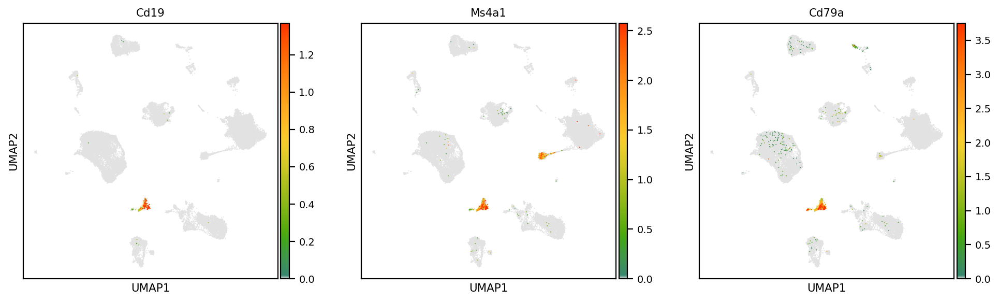

In [ ]:
#B cells
#Markers from https://www.cellsignal.com/pathways/immune-cell-markers-mouse and https://www.nature.com/articles/s41591-021-01329-2/figures/1

#B = Cd19+, Cd20+(Ms4a1) Iga(Cd79a)+, IgA(Igha)
#Follicular b: Ighm/CD40(low), CD45R/Ptprc(high), CD23/Cr2, Cd38, CD23/Fcer1g

#Naive: Ighd+, Cd27-
#Switched memory: Ighd-, Cd27+
#Unswitched: Ighd+, Cd27+

#plasma = Bcma/Tnfrsf17+ or Cd138/Sdc1+

#markers of interest = Ccl11 (eotaxin, chemokine that attracts eosinophils)
marker_genes =['Cd19','Ms4a1','Cd79a']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")


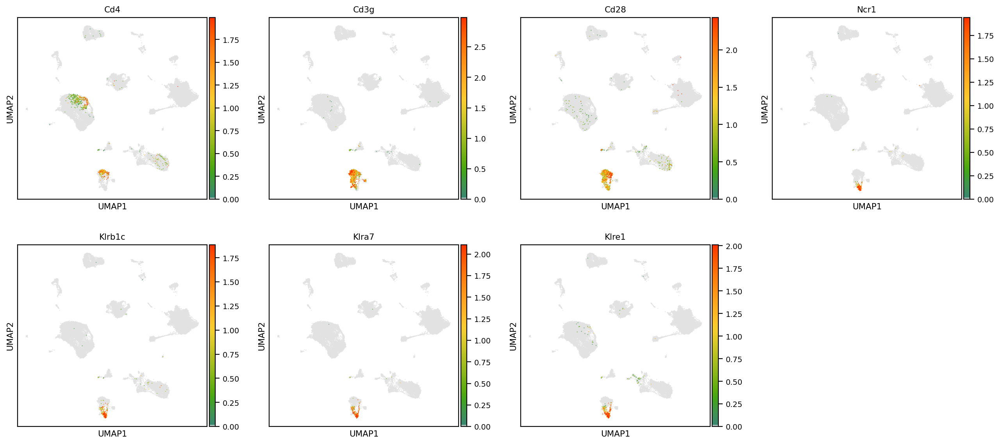

In [ ]:
#T, NKT, NK cells
#Markers from https://www.cellsignal.com/pathways/immune-cell-markers-mouse and https://www.nature.com/articles/s41591-021-01329-2/figures/1

#Treg = Cd4, Cd3g, Cd28, (From Ishizuka et al, 2018, Nature)


#NK cells = Ncr1+,Klrb1c+, Klra7, Klre1, Cd3- (From Ishizuka et al, 2018, Nature)

#markers of interest - eotaxin= Ccl11

marker_genes =['Cd4','Cd3g', 'Cd28','Ncr1','Klrb1c', 'Klra7', 'Klre1']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

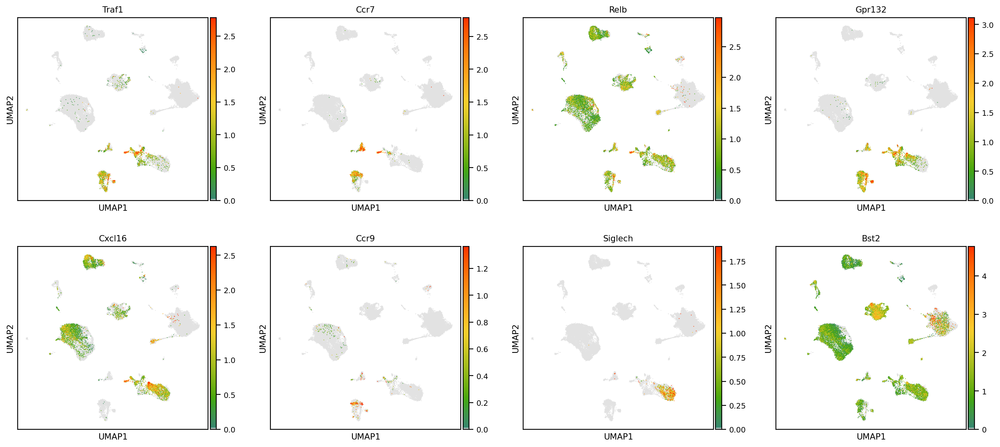

In [ ]:
##KA
#'Migratory cDC': ['Traf1', 'Ccr7', 'Relb', 'Gpr132', 'Cxcl16'],
#plasmacytoid DC = Ccr9, Siglech, Bst2 (From Ishizuka et al, 2018, Nature)


marker_genes =['Traf1', 'Ccr7', 'Relb', 'Gpr132', 'Cxcl16', 'Ccr9','Siglech','Bst2']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

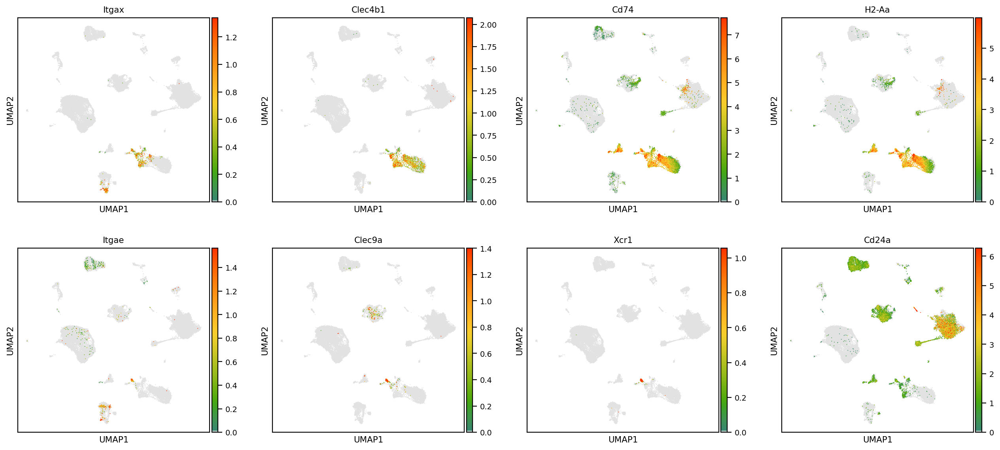

In [ ]:
#KA DC updated
#'cDC2': ['Itgax','Clec4b1','Cd74', 'H2-Aa'], #'H2-Ab1', 'H2-Eb1'
#'cDC1': ['Itgae',  'Clec9a', 'Xcr1', 'Cd24a'], #'Flt3', 'Cst3',
marker_genes =['Itgax','Clec4b1','Cd74', 'H2-Aa','Itgae',  'Clec9a', 'Xcr1', 'Cd24a']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

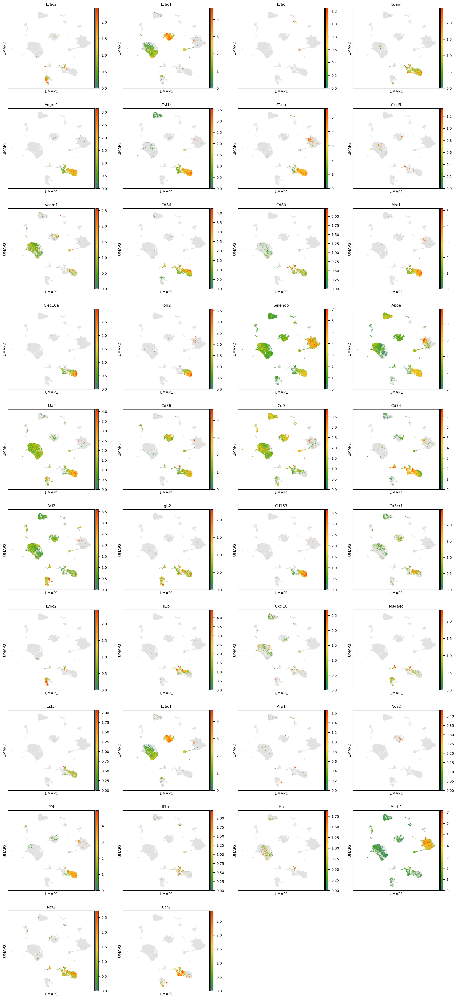

In [ ]:
#Immune markers from https://www.cellsignal.com/pathways/immune-cell-markers-mouse

#All macrohphages = Itgam, Adgre1 (From Ishizuka et al, 2018, Nature)
  # Csf1r from CellSignal
#M1 = C1qa, Cxcl9, Vcam1 (From Ishizuka et al, 2018, Nature)
  # Cd86, Cd80 from CellSignal
#M2 = Mrc1, Clec10a, Folr2, Sepp1/Selenop, Apoe, Maf (From Ishizuka et al, 2018, Nature)
  #Cd9, Cd74, Bcl2, Arg1, Cd36. https://www.frontiersin.org/articles/10.3389/fimmu.2019.01084/full
  #Cd163 from CellSignal
#M0 macrophage =Cx3cr1 (Cell singal)

#Monocyte =  Itgam, Ly6c2, Il1b, Cxcl10, Ms4a4c, (From Ishizuka et al, 2018, Nature)
  #note Cd14+, Adgre1- from CellSignal
#MDSC = Itgam, Arg1, Nos2, Pf4, Il1rn (From Ishizuka et al, 2018, Nature)
  #"subpopulations have been shown to exist: PMN-MDSC (CD11b+Ly6G+Ly6Clo) and M-MDSC (CD11b+Ly6G−Ly6Chi)" https://www.nature.com/articles/ncomms12150#Tab3


#neutrophil = itgam, ly6c2, Hp, Msrb1, Ncf2

#PMN=Ly6g, Adgre1+,
#Ccr2= monocyte, DCs, Macrophages
#Csf3r+ = monocytes, macrophages, PMN


marker_genes =['Ly6c2','Ly6c1','Ly6g','Itgam', 'Adgre1','Csf1r','C1qa', 'Cxcl9', 'Vcam1','Cd86','Cd80','Mrc1', 'Clec10a', 'Folr2', 'Selenop', 'Apoe', 'Maf','Cd36','Cd9', 'Cd74', 'Bcl2','Itgb2','Cd163','Cx3cr1','Ly6c2','Il1b', 'Cxcl10', 'Ms4a4c','Csf3r','Ly6c1','Arg1', 'Nos2', 'Pf4', 'Il1rn','Hp', 'Msrb1', 'Ncf2', 'Ccr2']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

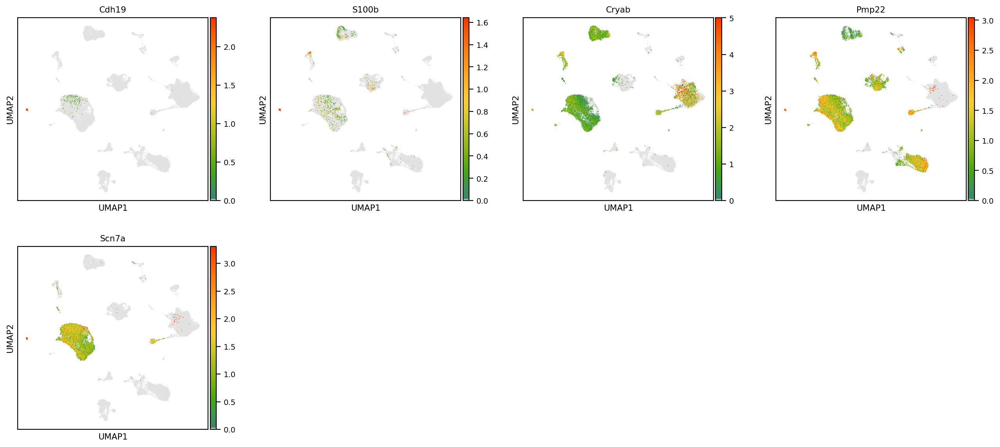

In [ ]:
#'Schwann':['Cdh19','S100b','Cryab','Pmp22','Scn7a'],
marker_genes = ['Cdh19','S100b','Cryab','Pmp22','Scn7a']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

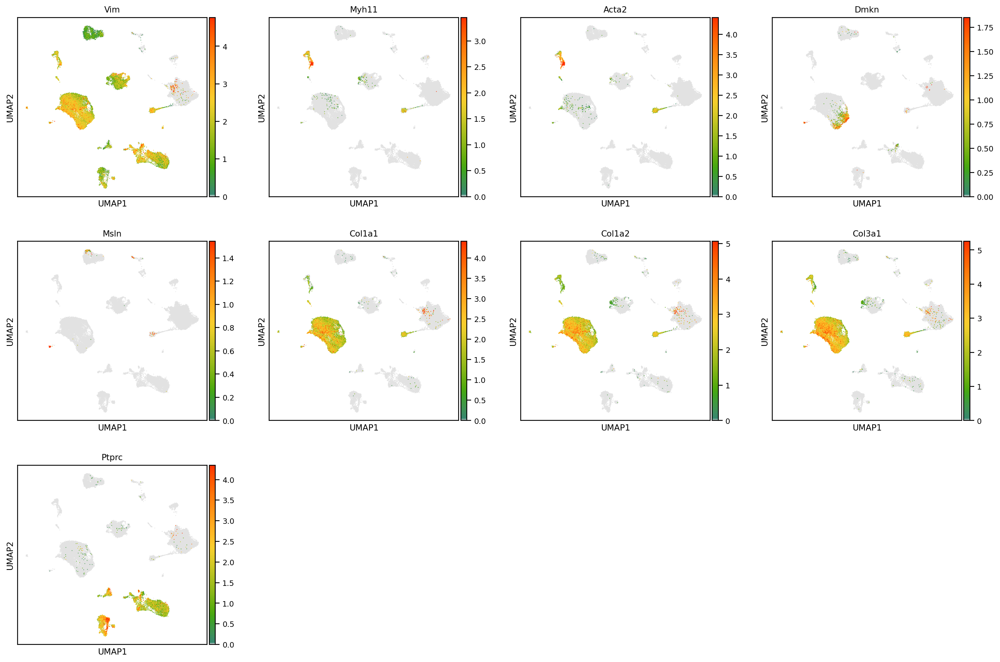

In [ ]:

marker_genes = ['Vim','Myh11','Acta2','Dmkn','Msln','Col1a1','Col1a2','Col3a1','Ptprc']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

###Remove cluster 11 because lncRNA top gene

In [ ]:
adata = adata[adata.obs['leiden_r0.4'] != '11', :]
adata

View of AnnData object with n_obs × n_vars = 41258 × 20732
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'ADM', 'Ductal', 'Acinar'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'donor_colors', 'neighbors', 'pca', 'sample_color

## Annotation

In [ ]:
#Cells annotated 01/09/23
adata.obs['annotated'] = adata.obs['leiden_r0.4'].cat.add_categories(['Acinar','Schwann','Mesothelial','Fibro/Ductal','Doublets?','DCs','ADM?','Bcell','Acinar?','Ductal','NaiveB','T','NK(T?)','ADM','RBC2','Monocyte?','Macrophage / DC','B','Plasmacytoid_DCs','Monocyte/PMN?','Immune','Endothelial','Endothelial2','Endocrine','Endocrine2','Endocrine3','Plasma_cells','Fibroblast','Fibroblast2','Fibroblast3','Macrophage1','Macrophage2','T / NK','Immune?','Immune1','Immune2','Immune3','Immune4','Immune5','Pericyte','Acinar2?','_1?_', '_2?_','_3?_','MitoHigh','RBC','Junk?'])

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['0',])] = 'Acinar'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['5'])] = 'Ductal'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['2'])] = 'Endothelial'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['1','4'])] = 'Fibroblast'

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['3','','7'])] = 'Macrophage / DC'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['10'])] = 'B'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['6',''])] = 'T / NK'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['16'])] = 'RBC'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['14'])] = 'Schwann'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['15'])] = 'Mesothelial'

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['8'])] = 'Fibroblast2'

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['13'])] = 'Fibroblast3'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['17'])] = 'Endothelial2'

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['12'])] = 'Endocrine'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['9'])] = 'Pericyte'

adata.obs['annotated'] = adata.obs['annotated'].cat.remove_unused_categories()

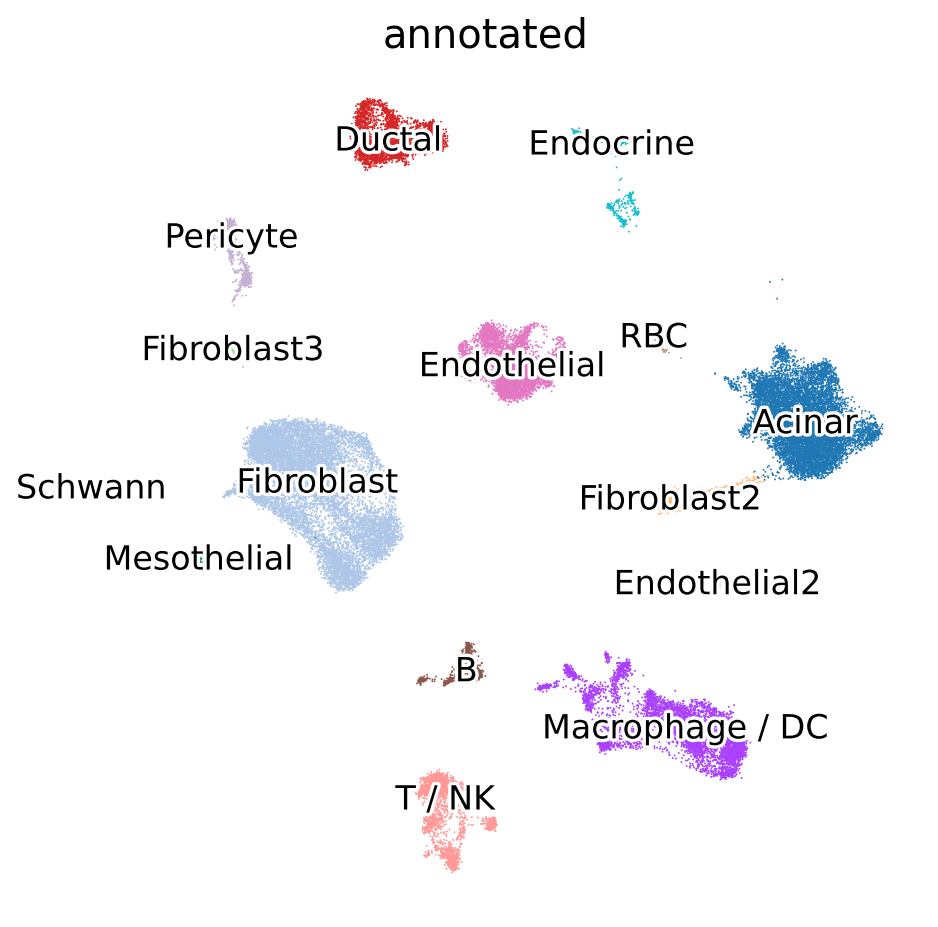

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['annotated'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

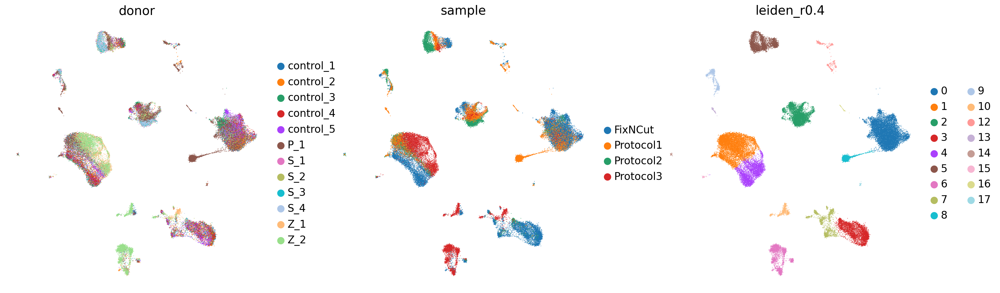

In [ ]:
leiden='leiden_r0.4'
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['donor','sample',leiden], legend_loc='right margin',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

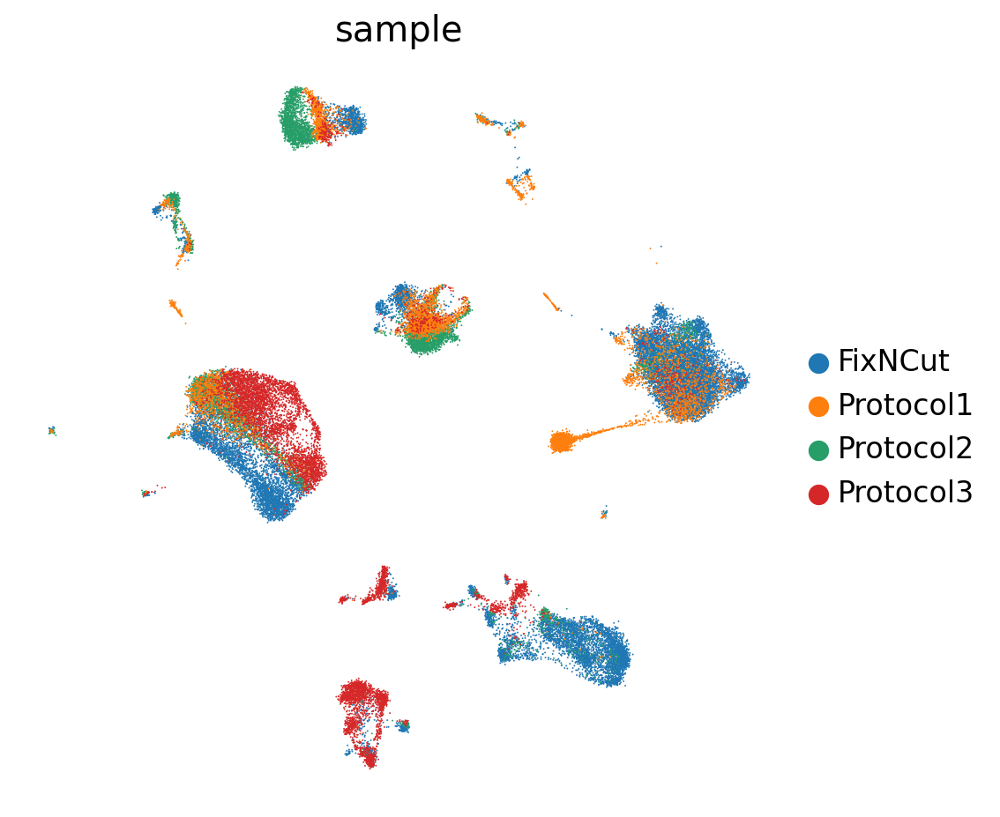

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['sample'], legend_loc='right margin',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

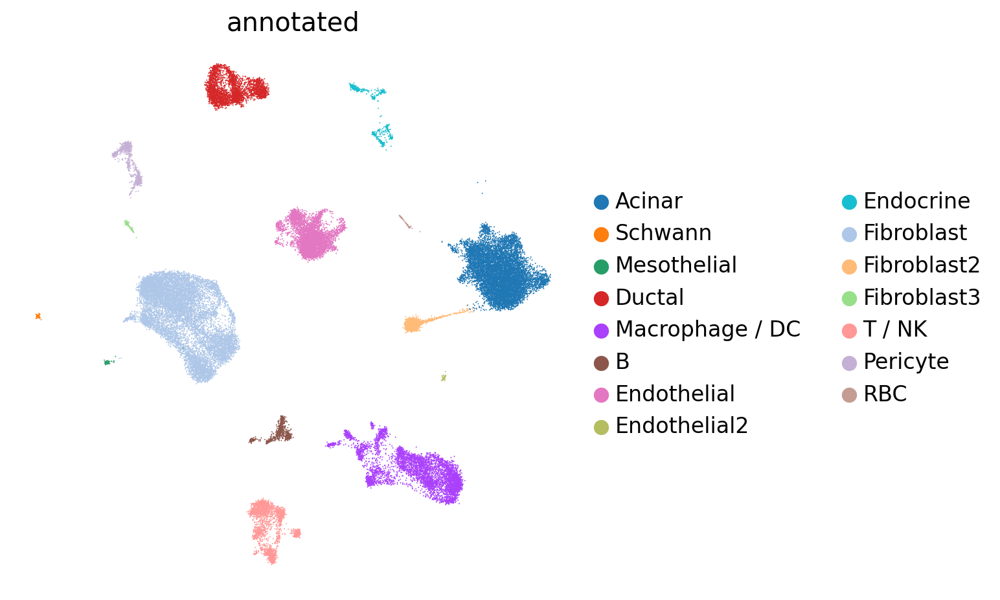

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['annotated'], legend_loc='right margin',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

In [ ]:
adata

AnnData object with n_obs × n_vars = 41258 × 20732
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'ADM', 'Ductal', 'Acinar', 'annotated'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'donor_colors', 'neighbors', 'pca', 'sample_

##Annotated2

In [ ]:
#Cells annotated 01/09/23
adata.obs['annotated2'] = adata.obs['leiden_r0.4'].cat.add_categories(['Acinar','Schwann','Mesothelial','Fibro/Ductal','Doublets?','DCs','ADM?','Bcell','Acinar?','Ductal','NaiveB','T','NK(T?)','ADM','RBC2','Monocyte?','Macrophage / DC','B','Plasmacytoid_DCs','Monocyte/PMN?','Immune','Endothelial','Endothelial2','Endocrine','Endocrine2','Endocrine3','Plasma_cells','Fibroblast','Fibroblast2','Fibroblast3','Macrophage1','Macrophage2','T / NK','Immune?','Immune1','Immune2','Immune3','Immune4','Immune5','Pericyte','Acinar2?','_1?_', '_2?_','_3?_','MitoHigh','RBC','Junk?'])

adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['0'])] = 'Acinar'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], [''])] = 'Doublets?'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['5'])] = 'Ductal'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['2','17'])] = 'Endothelial'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['1','4','13'])] = 'Fibroblast'

adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['3','7'])] = 'Macrophage / DC'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['10'])] = 'B'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['6',''])] = 'T / NK'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['16'])] = 'RBC'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['14'])] = 'Schwann'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['15'])] = 'Mesothelial'

adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['8'])] = 'Fibroblast2'

adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['12'])] = 'Endocrine'
adata.obs['annotated2'][np.in1d(adata.obs['annotated2'], ['9'])] = 'Pericyte'

adata.obs['annotated2'] = adata.obs['annotated2'].cat.remove_unused_categories()

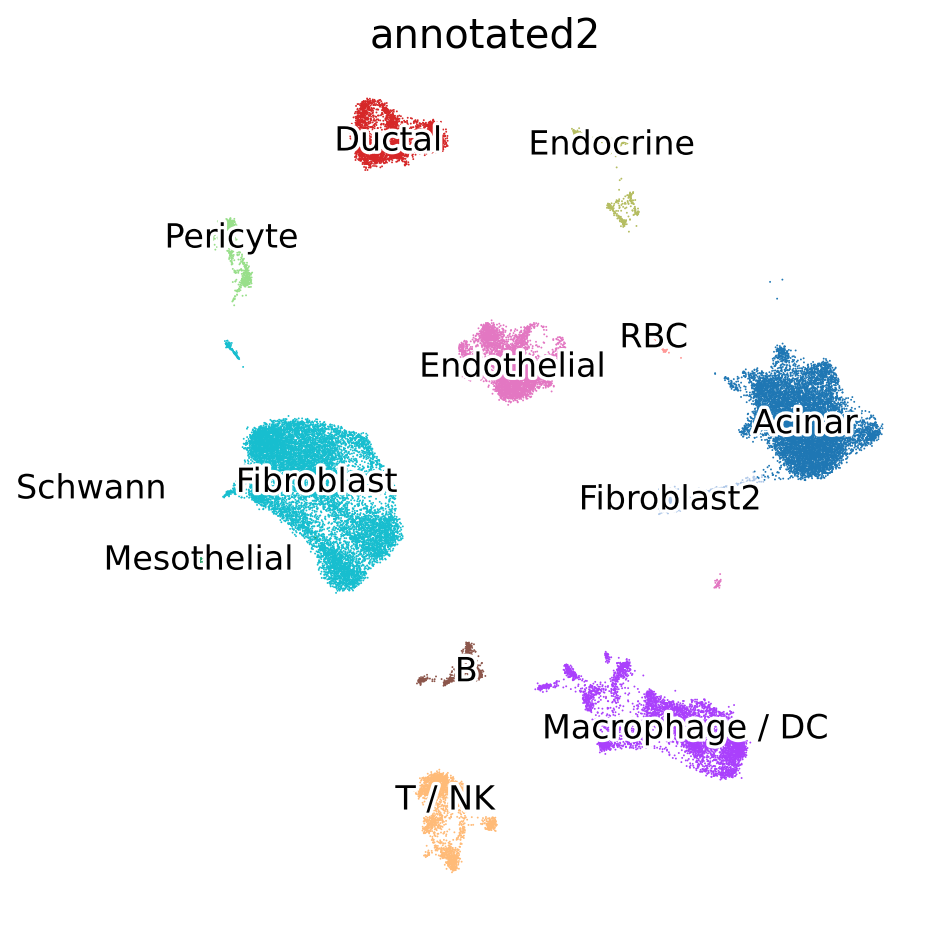

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['annotated2'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

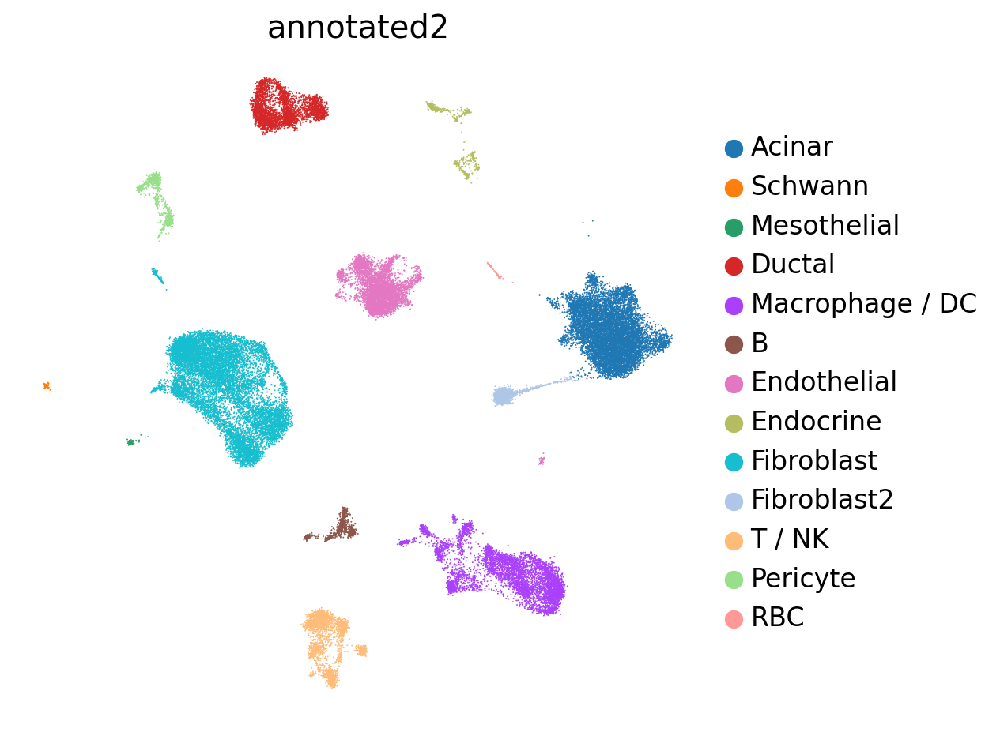

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['annotated2'], legend_loc='right margin',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

#Marker genes table

####annotated

In [ ]:
cluster_by="annotated"

In [ ]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, cluster_by, method='wilcoxon',n_genes=adata.shape[1],layer='PFlog1pPF_normalization', rankby_abs=False,corr_method='bonferroni',key_added=f"wilcoxon_rank_groups_{cluster_by}" )
wilcoxon=pd.DataFrame(adata.uns[f"wilcoxon_rank_groups_{cluster_by}"]['names']).head(100)
wilcoxon

,Acinar,Schwann,Mesothelial,Ductal,Macrophage / DC,B,Endothelial,Endothelial2,Endocrine,Fibroblast,Fibroblast2,Fibroblast3,T / NK,Pericyte,RBC
0,Prss2,Csmd1,Igfbp6,Pkhd1,Lyz2,Igkc,Flt1,Mmrn1,Ccser1,Dcn,Gcg,Adamdec1,Skap1,Cald1,Hbb-bt
1,Cpa1,Cadm2,C3,Spp1,Tyrobp,Cd74,Fabp4,Reln,Epcam,Col1a2,Lrp1b,Bmp4,Ptprc,Myl9,Hba-a1
2,Ctrb1,Prnp,Upk3b,Tm4sf4,Fcer1g,Cd79a,Plvap,Ccl21a,Rap1gap2,Gsn,Hbb-bs,Tcf21,Arhgap15,Ndufa4l2,Hba-a2
3,2210010C04Rik,Cd9,Gpm6a,Dcdc2a,Ctss,Mef2c,Egfl7,Flt4,Pip5k1b,Col3a1,Iapp,Bmp5,Itk,Mfge8,Hbb-bs
4,Pnliprp1,Slc35f1,Sox6,Atp1b1,Rbpj,H2-Eb1,Ly6c1,Cldn5,Ptprn2,Clec3b,Ins2,Postn,Cd52,Cacna1c,Blvrb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Rpl29,Tspan15,Tns3,Eps8l2,Wnk1,Uba52,H2-K1,Abhd17b,Cadps,Mxra8,Gm12216,C1ra,Akap13,Map3k20,Eif1
96,Nucb2,Psap,Hacd4,Pik3ap1,Fcgr2b,Gm31243,Shank3,Lims1,Hist1h2bc,Arhgap24,S100a6,Lamb1,Scml4,Cacnb2,Spta1
97,Gamt,Itih5,Hspb1,Carmil1,Elmo1,Ankrd44,Rasal2,Col18a1,Akr1c12,Tuba1a,H3f3b,Pard3b,Runx1,Ifitm3,March3
98,Fau,Tax1bp3,Osr1,Tesc,Maf,Bcl11a,Rai14,Sash1,Gmds,Nfia,Pcdh15,Tox,Tnfaip3,Rasl11a,St3gal5


In [ ]:
savetable=samplename +cluster_by+"_wilcoxon_marker_genes_20230424.csv"
wilcoxon.to_csv(savetable)

###annotated2

In [ ]:
cluster_by="annotated2"

In [ ]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, cluster_by, method='wilcoxon',n_genes=adata.shape[1],layer='PFlog1pPF_normalization', rankby_abs=False,corr_method='bonferroni',key_added=f"wilcoxon_rank_groups_{cluster_by}" )
wilcoxon=pd.DataFrame(adata.uns[f"wilcoxon_rank_groups_{cluster_by}"]['names']).head(100)
wilcoxon

,Acinar,Schwann,Mesothelial,Ductal,Macrophage / DC,B,Endothelial,Endocrine,Fibroblast,Fibroblast2,T / NK,Pericyte,RBC
0,Prss2,Csmd1,Igfbp6,Pkhd1,Lyz2,Igkc,Flt1,Ccser1,Dcn,Gcg,Skap1,Cald1,Hbb-bt
1,Cpa1,Cadm2,C3,Spp1,Tyrobp,Cd74,Fabp4,Epcam,Col1a2,Lrp1b,Ptprc,Myl9,Hba-a1
2,Ctrb1,Prnp,Upk3b,Tm4sf4,Fcer1g,Cd79a,Plvap,Rap1gap2,Gsn,Hbb-bs,Arhgap15,Ndufa4l2,Hba-a2
3,2210010C04Rik,Cd9,Gpm6a,Dcdc2a,Ctss,Mef2c,Egfl7,Pip5k1b,Col3a1,Iapp,Itk,Mfge8,Hbb-bs
4,Pnliprp1,Slc35f1,Sox6,Atp1b1,Rbpj,H2-Eb1,Emcn,Ptprn2,Clec3b,Ins2,Cd52,Cacna1c,Blvrb
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Rpl29,Tspan15,Tns3,Eps8l2,Wnk1,Uba52,Shank3,Cadps,Pla1a,Gm12216,Akap13,Map3k20,Eif1
96,Nucb2,Psap,Hacd4,Pik3ap1,Fcgr2b,Gm31243,Mcf2l,Hist1h2bc,Arhgap24,S100a6,Scml4,Cacnb2,Spta1
97,Gamt,Itih5,Hspb1,Carmil1,Elmo1,Ankrd44,Rai14,Akr1c12,Tuba1a,H3f3b,Runx1,Ifitm3,March3
98,Fau,Tax1bp3,Osr1,Tesc,Maf,Bcl11a,H2-K1,Gmds,Lpar1,Pcdh15,Tnfaip3,Rasl11a,St3gal5


In [ ]:
savetable=samplename +cluster_by+"_wilcoxon_marker_genes_20230424.csv"
wilcoxon.to_csv(savetable)

#Save annotated object

In [ ]:
adata

AnnData object with n_obs × n_vars = 41258 × 20732
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'condition', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'ADM', 'Ductal', 'Acinar', 'annotated', 'annotated2'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'donor_colors', 'neighbors', '

In [ ]:
adata.write(samplename+'_QCfilteredNormalized_Harmony_Triku_Neighbors_annotated_20230425.h5ad')